In [1]:
import numpy as np
import pandas as pa
import sklearn
import networkx as nx
import csv
import matplotlib as plty
import matplotlib.pylab as plt

In [2]:
%matplotlib notebook

## Sample Data

In [3]:
with open("SampleNetwork.csv") as infile:
    csv_reader = csv.reader(infile)
    next(csv_reader)
    G = nx.Graph(csv_reader)
print(G.nodes())

['A', 'C', 'B', 'D', 'J', 'E', 'F', 'G', 'H']


In [4]:
G.edges

EdgeView([('A', 'C'), ('A', 'B'), ('A', 'D'), ('C', 'F'), ('B', 'D'), ('J', 'E'), ('E', 'F'), ('G', 'H')])

In [5]:
pos = {'A': (0, 0), 'B': (1, 0.265), 'C': (-1, 0.8591), 'D': (2, 0.156), 'E': (-2, 0.521),
      'F':(3,0.51), 'G':(-3,0.9),'H':(-5,1), 'J':(-4,0.216)}

<IPython.core.display.Javascript object>


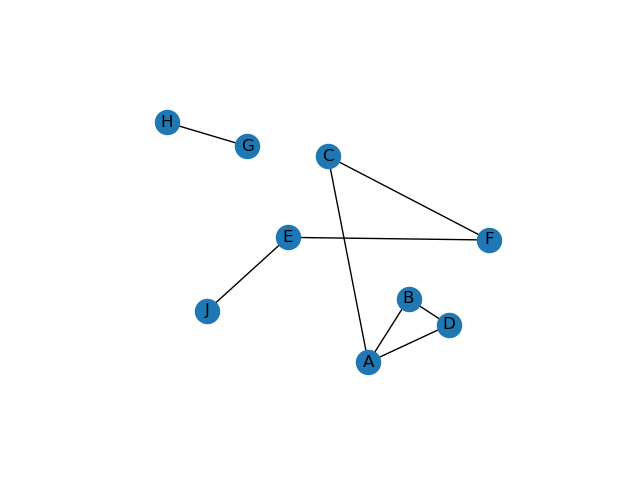

In [6]:
nx.draw_networkx(G,pos)
ax = plt.gca()
ax.margins(0.20)
plt.axis("off")
plt.show()
plt.savefig("petersen.jpg")

In [7]:
nx.write_graphml(G,"my_graph.graphml")

## My-Data

In [8]:
csv_file_path = 'Protein_functions_graph.csv'
data = []
# Read data from the CSV file and convert each row to a tuple
with open(csv_file_path, 'r', newline='') as csvfile:
    csv_reader = csv.reader(csvfile)
    for row in csv_reader:
        data.append(tuple(row))

In [9]:
G = nx.Graph()
# Add nodes and edges to the graph
for node_a, node_b in data:
    G.add_node(node_a, bipartite=0)  # t_tax_seq_id
    G.add_node(node_b, bipartite=1)  # go_function
    G.add_edge(node_a, node_b)

# Separate nodes into two sets
set_a = {node for node, bipartite in G.nodes(data=True) if bipartite["bipartite"] == 0}
set_b = {node for node, bipartite in G.nodes(data=True) if bipartite["bipartite"] == 1}
nx.write_graphml(G,"my_graph.graphml")

In [10]:
plt.figure(figsize=(100, 100))
# Draw the bipartite graph without labels
pos = {node: (1, i) for i, node in enumerate(set_a)}
pos.update({node: (2, i) for i, node in enumerate(set_b)})
nx.draw(G, pos, with_labels=False, node_color="skyblue", node_size=50)
plt.title("Bipartite Graph")
plt.show()

<IPython.core.display.Javascript object>

In [11]:
plt.savefig("Grpahoooo.jpg")